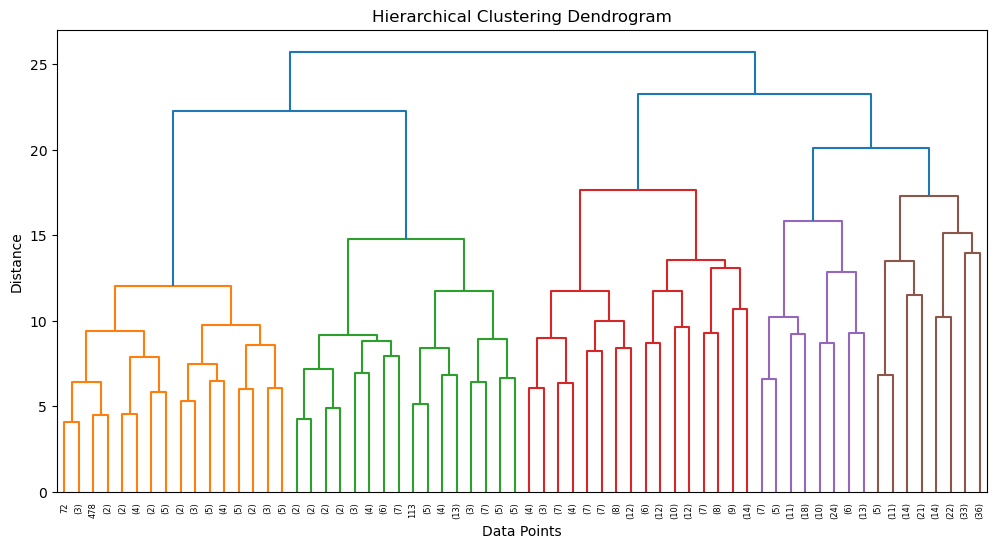

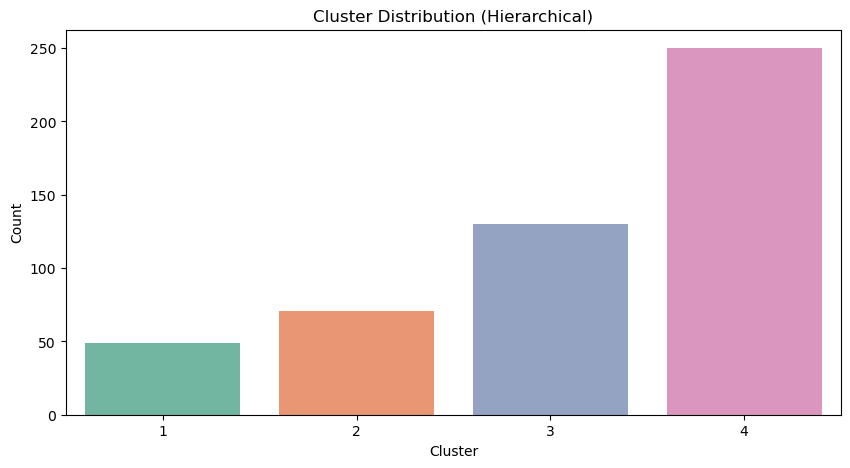

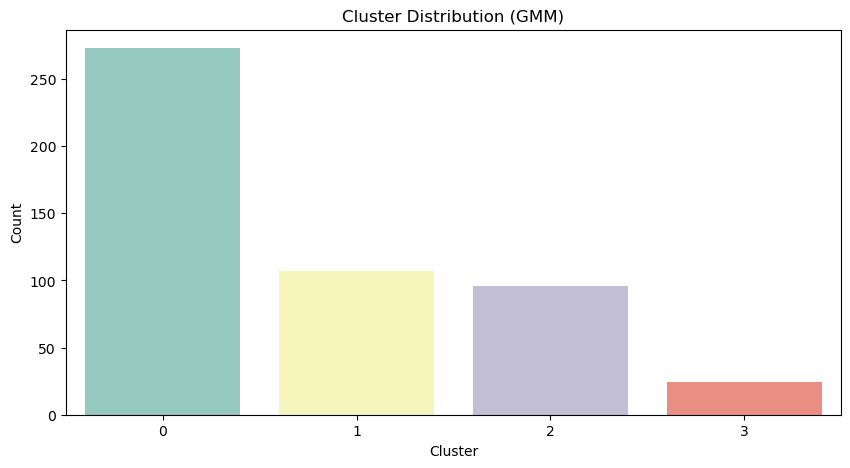

Clustered dataset saved as 'health_women_clustered.csv'


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler, LabelEncoder

import warnings
warnings.simplefilter("ignore", UserWarning)



# Load the dataset
df = pd.read_csv("health_women_clustering.csv")  # Ensure this file is in the same directory

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in df.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

# Standardize numerical features
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Perform Hierarchical Clustering
linkage_matrix = linkage(df_scaled, method='ward')

# Plot Dendrogram
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, truncate_mode='level', p=5)  # Show first 5 levels
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Data Points")
plt.ylabel("Distance")
plt.show()

# Determine optimal clusters and apply hierarchical clustering
num_clusters = 4  # Based on dendrogram analysis
df['Cluster_Hierarchical'] = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

# Apply Gaussian Mixture Model (GMM)
gmm = GaussianMixture(n_components=num_clusters, random_state=42)
df['Cluster_GMM'] = gmm.fit_predict(df_scaled)

# Visualize Cluster Distribution
plt.figure(figsize=(10, 5))
sns.countplot(x=df['Cluster_Hierarchical'], palette='Set2')
plt.title("Cluster Distribution (Hierarchical)")
plt.xlabel("Cluster")
plt.ylabel("Count")
plt.show()

plt.figure(figsize=(10, 5))
sns.countplot(x=df['Cluster_GMM'], palette='Set3')
plt.title("Cluster Distribution (GMM)")
plt.xlabel("Cluster")
plt.ylabel("Count")
plt.show()

# Save processed dataset with cluster labels
df.to_csv("health_women_clustered.csv", index=False)
print("Clustered dataset saved as 'health_women_clustered.csv'")


In [2]:
print(df.head())


   Age        BMI  Exercise_Hours_per_Week  Sleep_Hours_per_Day  Stress_Level  \
0   56  32.663810                        6             7.568660             4   
1   46  25.578401                        1             7.699627             5   
2   32  30.889373                        6             7.677665             8   
3   25  30.949957                        9             5.793015             4   
4   38  20.201544                        6             9.611211             4   

   Chronic_Diseases  Medication_Usage  Diet_Type  Mental_Health_Score  \
0                 1                 0          3             3.506237   
1                 0                 0          4             8.676838   
2                 3                 0          1             9.355452   
3                 2                 0          0             9.967585   
4                 3                 2          0             8.164067   

   Menstrual_Cycle  Family_History  Smoking_Habits  Alcohol_Consumption  \

In [3]:
df.head()

,Age,BMI,Exercise_Hours_per_Week,Sleep_Hours_per_Day,Stress_Level,Chronic_Diseases,Medication_Usage,Diet_Type,Mental_Health_Score,Menstrual_Cycle,Family_History,Smoking_Habits,Alcohol_Consumption,Occupation_Type,Healthcare_Access,Cluster_Hierarchical,Cluster_GMM
0,56,32.663810,6,7.568660,4,1,0,3,3.506237,2,0,0,2,1,2,3,0
1,46,25.578401,1,7.699627,5,0,0,4,8.676838,1,2,0,1,2,1,2,2
2,32,30.889373,6,7.677665,8,3,0,1,9.355452,2,2,1,2,2,1,1,0
3,25,30.949957,9,5.793015,4,2,0,0,9.967585,2,3,0,1,2,0,4,0
4,38,20.201544,6,9.611211,4,3,2,0,8.164067,2,3,2,0,0,1,4,3


In [4]:
print(df['Cluster_Hierarchical'].value_counts())

Cluster_Hierarchical
4    250
3    130
2     71
1     49
Name: count, dtype: int64


In [5]:
print(df['Cluster_GMM'].value_counts())

Cluster_GMM
0    273
1    107
2     96
3     24
Name: count, dtype: int64


In [6]:
print(df.isnull().sum())  # Check for missing values (NaN)


Age                        0
BMI                        0
Exercise_Hours_per_Week    0
Sleep_Hours_per_Day        0
Stress_Level               0
Chronic_Diseases           0
Medication_Usage           0
Diet_Type                  0
Mental_Health_Score        0
Menstrual_Cycle            0
Family_History             0
Smoking_Habits             0
Alcohol_Consumption        0
Occupation_Type            0
Healthcare_Access          0
Cluster_Hierarchical       0
Cluster_GMM                0
dtype: int64


In [7]:
print(np.isinf(df).sum()) # Check for infinite values

Age                        0
BMI                        0
Exercise_Hours_per_Week    0
Sleep_Hours_per_Day        0
Stress_Level               0
Chronic_Diseases           0
Medication_Usage           0
Diet_Type                  0
Mental_Health_Score        0
Menstrual_Cycle            0
Family_History             0
Smoking_Habits             0
Alcohol_Consumption        0
Occupation_Type            0
Healthcare_Access          0
Cluster_Hierarchical       0
Cluster_GMM                0
dtype: int64


In [8]:
import numpy as np

# Replace infinite values with NaN
df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop NaN values
df.dropna(inplace=True)


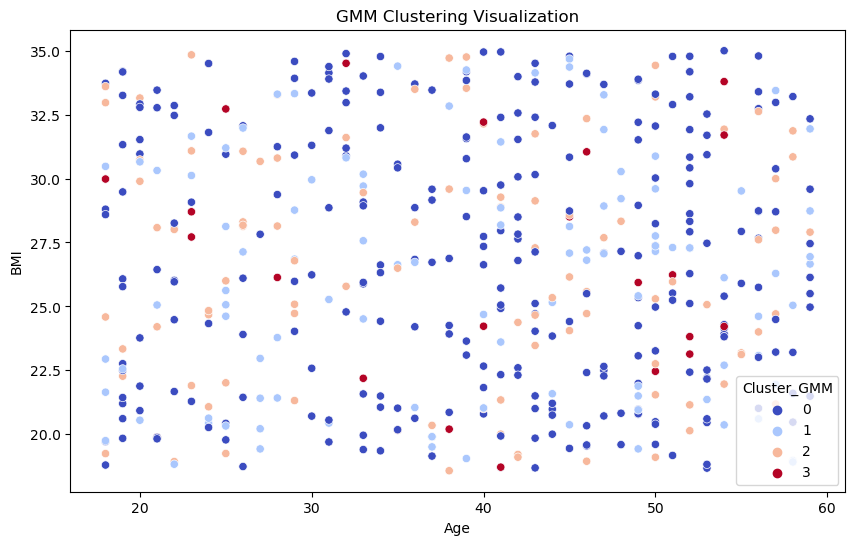

In [9]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df.iloc[:, 0], y=df.iloc[:, 1], hue=df['Cluster_GMM'], palette="coolwarm")
plt.title("GMM Clustering Visualization")
plt.show()


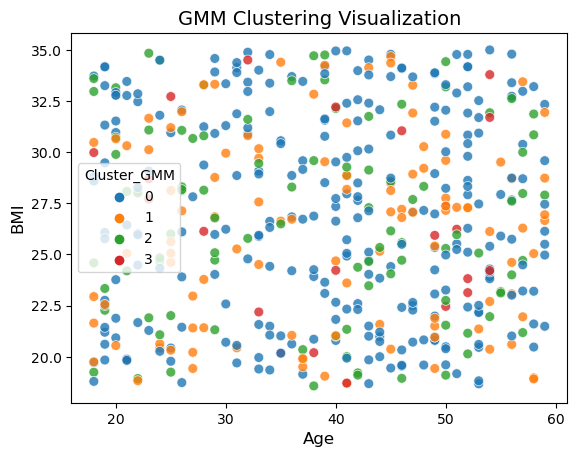

In [10]:
sns.scatterplot(x=df["Age"], y=df["BMI"], hue=df["Cluster_GMM"], 
                palette="tab10", s=50, alpha=0.8)
plt.title("GMM Clustering Visualization", fontsize=14)
plt.xlabel("Age", fontsize=12)
plt.ylabel("BMI", fontsize=12)
plt.legend(title="Cluster_GMM")
plt.show()


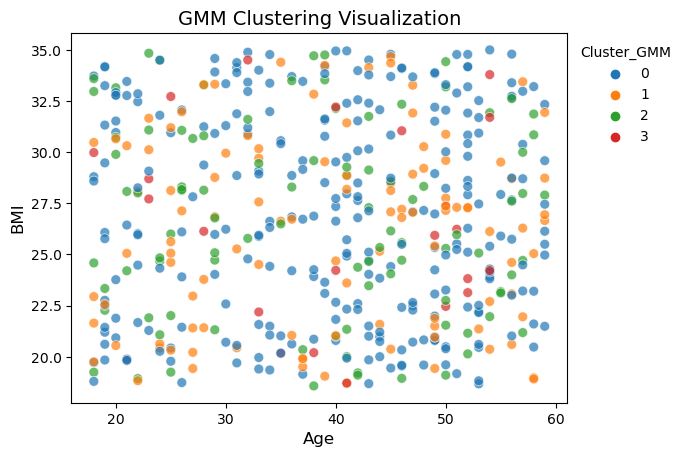

In [11]:
sns.scatterplot(x=df["Age"], y=df["BMI"], hue=df["Cluster_GMM"], 
                palette="tab10", s=50, alpha=0.7)

plt.title("GMM Clustering Visualization", fontsize=14)
plt.xlabel("Age", fontsize=12)
plt.ylabel("BMI", fontsize=12)

# Better legend positioning
plt.legend(title="Cluster_GMM", bbox_to_anchor=(1, 1), frameon=False)

plt.show()


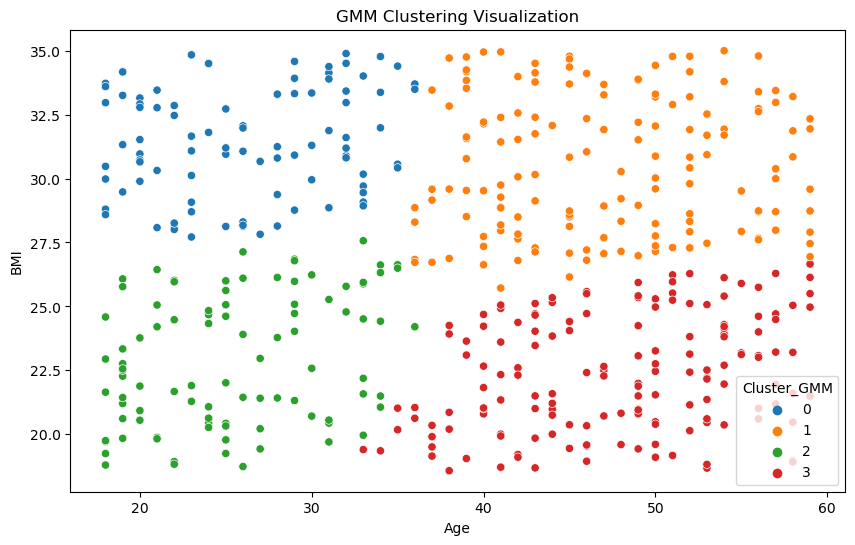

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

import warnings
warnings.simplefilter("ignore", UserWarning)


# Simulate Data 
np.random.seed(42)
age = np.random.randint(18, 60, 500)  # Age feature
bmi = np.random.uniform(18.5, 35, 500)  # BMI feature
data = pd.DataFrame({'Age': age, 'BMI': bmi})

# Scale the data (GMM works better with normalized data)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# GMM Clustering
n_clusters = 4  # Set number of clusters
gmm = GaussianMixture(n_components=n_clusters, covariance_type='full', random_state=42)
data['Cluster_GMM'] = gmm.fit_predict(data_scaled)  # Assign cluster labels

# Visualize with seaborn (distinct clusters per group)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=data['Age'], y=data['BMI'], hue=data['Cluster_GMM'], palette='tab10')
plt.title('GMM Clustering Visualization')
plt.xlabel('Age')
plt.ylabel('BMI')
plt.legend(title='Cluster_GMM')
plt.show()


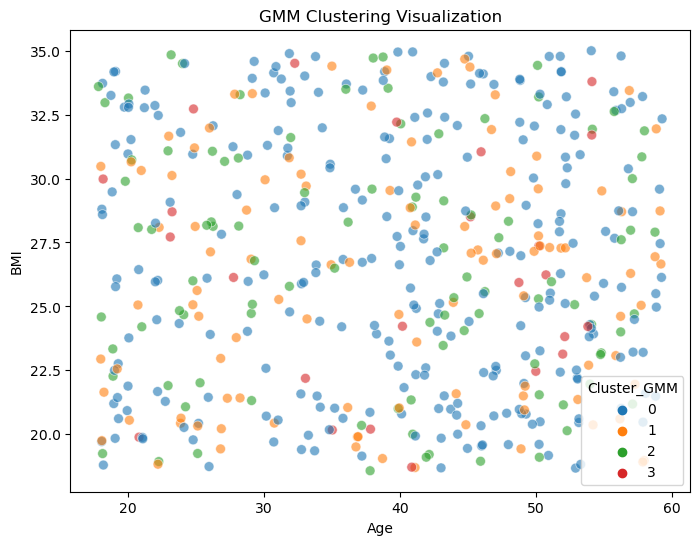

In [13]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Add slight jitter to avoid exact overlap
df["Age"] += np.random.uniform(-0.3, 0.3, size=len(df))

# Create scatter plot with transparency
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df["Age"], y=df["BMI"], hue=df["Cluster_GMM"], 
                palette="tab10", s=50, alpha=0.6)  # Reduce overlap with alpha

plt.title("GMM Clustering Visualization")
plt.show()


In [14]:
import pandas as pd
import numpy as np

data = {'A': [1, 2, np.inf, 4, 5], 'B': [10, 20, 30, np.inf, 50]}
df = pd.DataFrame(data)
print(df)


     A     B
0  1.0  10.0
1  2.0  20.0
2  inf  30.0
3  4.0   inf
4  5.0  50.0


In [15]:
df.replace([np.inf, -np.inf], np.nan, inplace=True)

In [16]:
print(df)

     A     B
0  1.0  10.0
1  2.0  20.0
2  NaN  30.0
3  4.0   NaN
4  5.0  50.0


In [17]:
df.dropna(inplace=True)


In [18]:
df.fillna(0, inplace=True)  # Replaces NaN with 0


In [19]:
print(df.columns)


Index(['A', 'B'], dtype='object')


In [20]:
df_original = df.copy()  # Always keep a backup before modifying the DataFrame


In [21]:
import pandas as pd

df = pd.read_csv("health_women_clustered.csv")  # Replace with actual file name
print(df.columns)  # Check available columns


Index(['Age', 'BMI', 'Exercise_Hours_per_Week', 'Sleep_Hours_per_Day',
       'Stress_Level', 'Chronic_Diseases', 'Medication_Usage', 'Diet_Type',
       'Mental_Health_Score', 'Menstrual_Cycle', 'Family_History',
       'Smoking_Habits', 'Alcohol_Consumption', 'Occupation_Type',
       'Healthcare_Access', 'Cluster_Hierarchical', 'Cluster_GMM'],
      dtype='object')


In [22]:
print(df.columns)  # Check if 'Cluster_Hierarchical' is still present


Index(['Age', 'BMI', 'Exercise_Hours_per_Week', 'Sleep_Hours_per_Day',
       'Stress_Level', 'Chronic_Diseases', 'Medication_Usage', 'Diet_Type',
       'Mental_Health_Score', 'Menstrual_Cycle', 'Family_History',
       'Smoking_Habits', 'Alcohol_Consumption', 'Occupation_Type',
       'Healthcare_Access', 'Cluster_Hierarchical', 'Cluster_GMM'],
      dtype='object')


In [23]:
print(df['Cluster_Hierarchical'].isnull().sum())  # Check for missing values
print(df.dtypes)  # Check if 'Cluster_Hierarchical' is numeric or categorical


0
Age                          int64
BMI                        float64
Exercise_Hours_per_Week      int64
Sleep_Hours_per_Day        float64
Stress_Level                 int64
Chronic_Diseases             int64
Medication_Usage             int64
Diet_Type                    int64
Mental_Health_Score        float64
Menstrual_Cycle              int64
Family_History               int64
Smoking_Habits               int64
Alcohol_Consumption          int64
Occupation_Type              int64
Healthcare_Access            int64
Cluster_Hierarchical         int64
Cluster_GMM                  int64
dtype: object


In [24]:
df['Cluster_Hierarchical'] = df['Cluster_Hierarchical'].astype(str)


In [25]:
print(df.shape)

(500, 17)


In [26]:
print(df.head())

   Age        BMI  Exercise_Hours_per_Week  Sleep_Hours_per_Day  Stress_Level  \
0   56  32.663810                        6             7.568660             4   
1   46  25.578401                        1             7.699627             5   
2   32  30.889373                        6             7.677665             8   
3   25  30.949957                        9             5.793015             4   
4   38  20.201544                        6             9.611211             4   

   Chronic_Diseases  Medication_Usage  Diet_Type  Mental_Health_Score  \
0                 1                 0          3             3.506237   
1                 0                 0          4             8.676838   
2                 3                 0          1             9.355452   
3                 2                 0          0             9.967585   
4                 3                 2          0             8.164067   

   Menstrual_Cycle  Family_History  Smoking_Habits  Alcohol_Consumption  \

In [27]:
df.dropna(subset=["Cluster_Hierarchical"], inplace=True)


In [28]:
print(df.columns)  #check 'Cluster_Hierarchical' is in the dataframe


Index(['Age', 'BMI', 'Exercise_Hours_per_Week', 'Sleep_Hours_per_Day',
       'Stress_Level', 'Chronic_Diseases', 'Medication_Usage', 'Diet_Type',
       'Mental_Health_Score', 'Menstrual_Cycle', 'Family_History',
       'Smoking_Habits', 'Alcohol_Consumption', 'Occupation_Type',
       'Healthcare_Access', 'Cluster_Hierarchical', 'Cluster_GMM'],
      dtype='object')


In [29]:
df.rename(columns={"wrong_column_name": "Cluster_Hierarchical"}, inplace=True)


In [30]:
print(df.describe())
print(df.var(numeric_only=True))  # Check variance in numeric columns


              Age         BMI  Exercise_Hours_per_Week  Sleep_Hours_per_Day  \
count  500.000000  500.000000               500.000000           500.000000   
mean    39.326000   26.649880                 4.472000             6.948754   
std     12.200386    4.831332                 2.956806             1.630899   
min     18.000000   18.576428                 0.000000             4.001995   
25%     29.000000   22.280138                 2.000000             5.523598   
50%     41.000000   26.628256                 4.500000             7.004795   
75%     50.000000   30.878104                 7.000000             8.134362   
max     59.000000   34.995342                 9.000000             9.972883   

       Stress_Level  Chronic_Diseases  Medication_Usage   Diet_Type  \
count    500.000000        500.000000        500.000000  500.000000   
mean       5.156000          2.172000          1.174000    2.016000   
std        2.527537          1.173529          0.874788    1.411286   
min 

In [31]:
df.describe()


,Age,BMI,Exercise_Hours_per_Week,Sleep_Hours_per_Day,Stress_Level,Chronic_Diseases,Medication_Usage,Diet_Type,Mental_Health_Score,Menstrual_Cycle,Family_History,Smoking_Habits,Alcohol_Consumption,Occupation_Type,Healthcare_Access,Cluster_GMM
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.00000,500.000000,500.000000
mean,39.326000,26.649880,4.472000,6.948754,5.156000,2.172000,1.174000,2.016000,5.326451,1.558000,2.112000,0.390000,1.320000,1.15400,1.244000,0.742000
std,12.200386,4.831332,2.956806,1.630899,2.527537,1.173529,0.874788,1.411286,2.620733,0.771899,0.966086,0.653264,0.789206,0.88987,0.573692,0.930143
min,18.000000,18.576428,0.000000,4.001995,1.000000,0.000000,0.000000,0.000000,1.012116,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,29.000000,22.280138,2.000000,5.523598,3.000000,2.000000,0.000000,1.000000,3.013772,1.000000,1.000000,0.000000,1.000000,0.00000,1.000000,0.000000
50%,41.000000,26.628256,4.500000,7.004795,5.000000,3.000000,1.000000,2.000000,5.153775,2.000000,2.000000,0.000000,2.000000,1.00000,1.000000,0.000000
75%,50.000000,30.878104,7.000000,8.134362,7.000000,3.000000,2.000000,3.000000,7.753461,2.000000,3.000000,1.000000,2.000000,2.00000,2.000000,1.000000
max,59.000000,34.995342,9.000000,9.972883,9.000000,3.000000,2.000000,4.000000,9.978605,2.000000,3.000000,2.000000,2.000000,2.00000,2.000000,3.000000


In [32]:
df.var(numeric_only=True)

Age                        148.849423
BMI                         23.341764
Exercise_Hours_per_Week      8.742701
Sleep_Hours_per_Day          2.659831
Stress_Level                 6.388441
Chronic_Diseases             1.377170
Medication_Usage             0.765255
Diet_Type                    1.991727
Mental_Health_Score          6.868242
Menstrual_Cycle              0.595828
Family_History               0.933323
Smoking_Habits               0.426754
Alcohol_Consumption          0.622846
Occupation_Type              0.791868
Healthcare_Access            0.329122
Cluster_GMM                  0.865166
dtype: float64

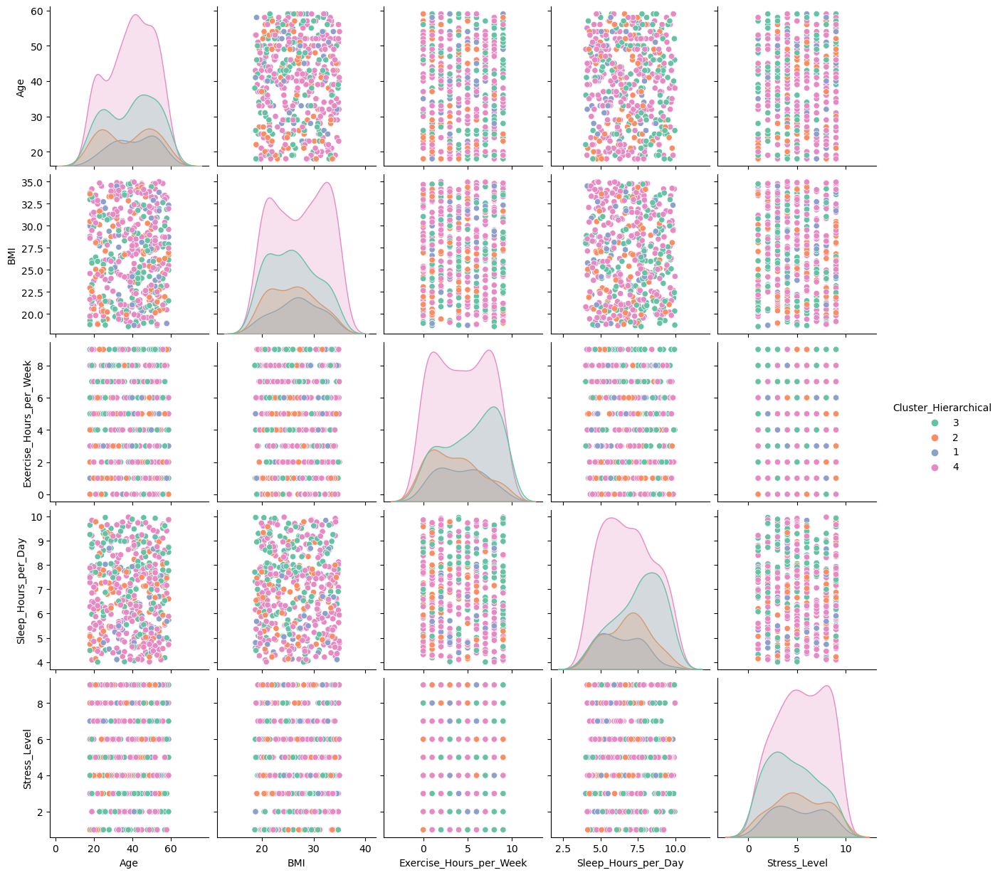

In [33]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

sample_cols = df.select_dtypes(include=[np.number]).columns[:5].tolist() + ['Cluster_Hierarchical']
sns.pairplot(df[sample_cols], hue="Cluster_Hierarchical", palette="Set2")
plt.show()


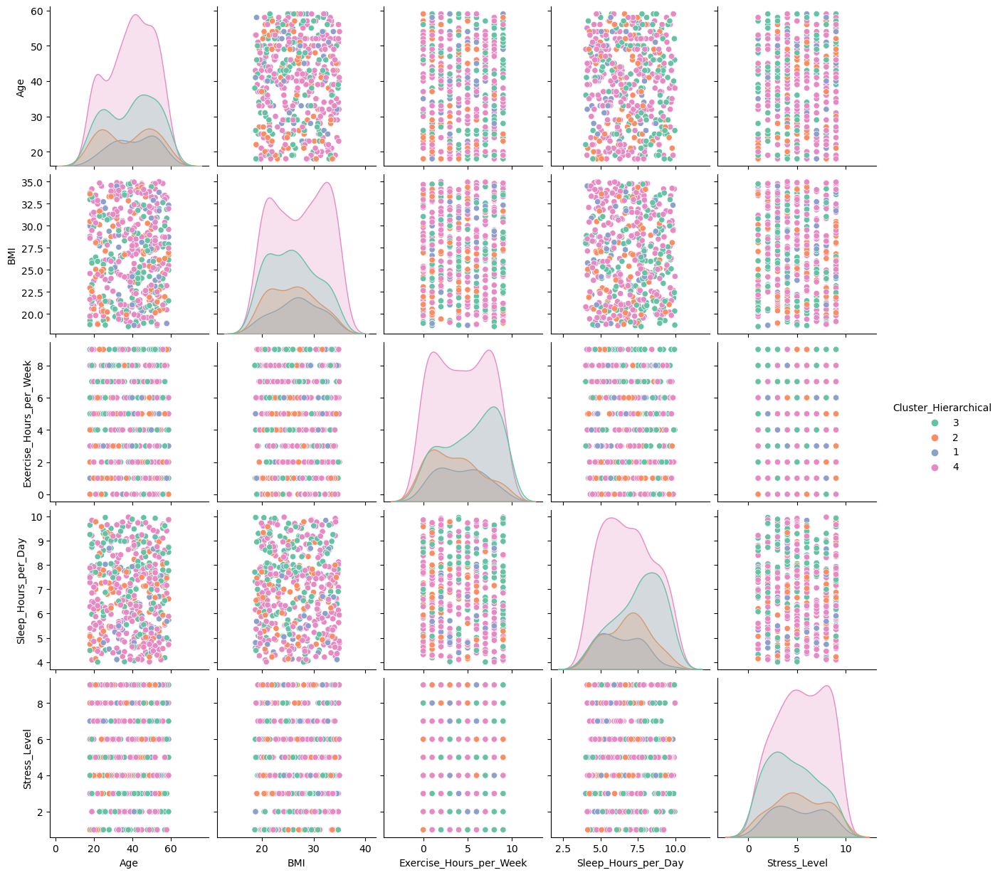

In [34]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


# Convert inf values to NaN
df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop NaN rows (if needed)
df.dropna(inplace=True)

# Select numerical columns for pairplot
sample_cols = df.select_dtypes(include=[np.number]).columns[:5].tolist() + ['Cluster_Hierarchical']

# Generate pairplot
sns.pairplot(df[sample_cols], hue="Cluster_Hierarchical", palette="Set2")
plt.show()


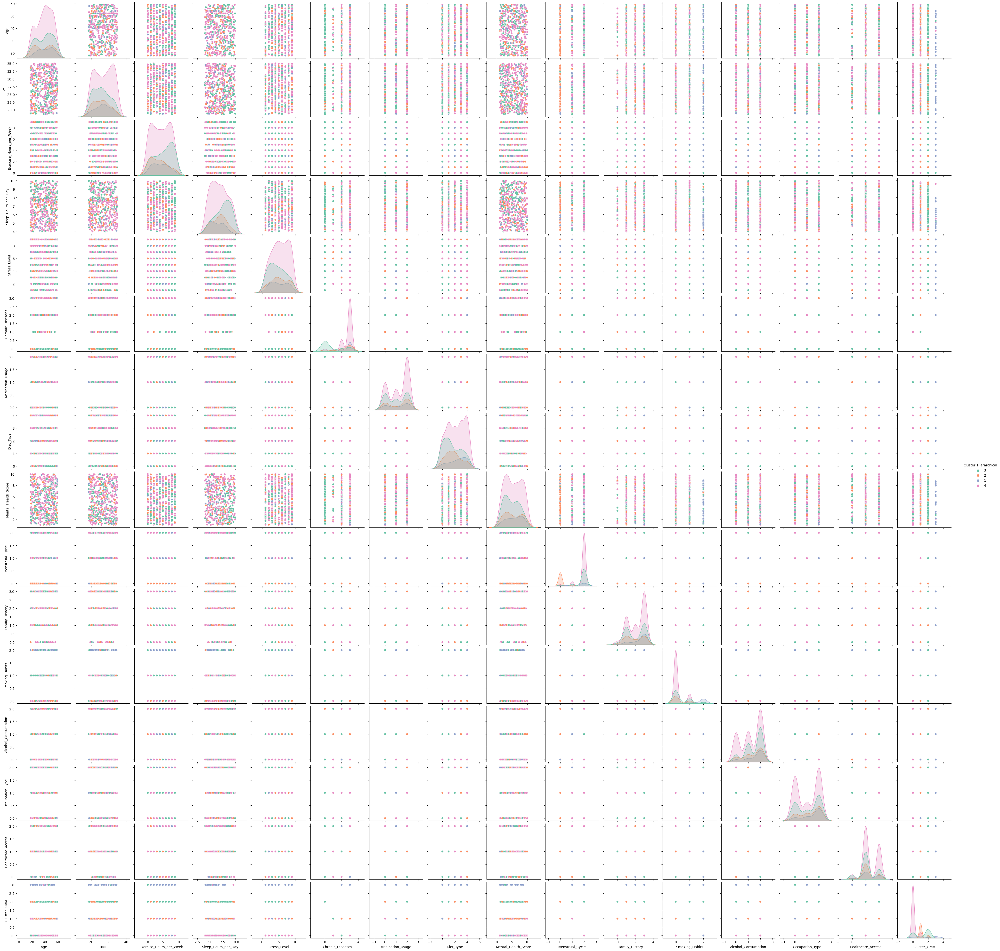

In [35]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv("health_women_clustered.csv")

# Convert 'Cluster_Hierarchical' to a string if it's categorical
df['Cluster_Hierarchical'] = df['Cluster_Hierarchical'].astype(str)

# Replace infinite values with NaN
df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Select only numeric columns
numeric_df = df.select_dtypes(include=[np.number])

# Manually add the cluster column if it was removed
numeric_df['Cluster_Hierarchical'] = df['Cluster_Hierarchical']

# Pairplot
sns.pairplot(numeric_df, hue="Cluster_Hierarchical", palette="Set2")
plt.show()


In [36]:
import pandas as pd

# Load dataset 
df = pd.read_csv('health_women_clustered.csv')

# Display basic info
print(df.info())

# Show first few rows
print(df.head())

# Check for missing values
print(df.isnull().sum())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      500 non-null    int64  
 1   BMI                      500 non-null    float64
 2   Exercise_Hours_per_Week  500 non-null    int64  
 3   Sleep_Hours_per_Day      500 non-null    float64
 4   Stress_Level             500 non-null    int64  
 5   Chronic_Diseases         500 non-null    int64  
 6   Medication_Usage         500 non-null    int64  
 7   Diet_Type                500 non-null    int64  
 8   Mental_Health_Score      500 non-null    float64
 9   Menstrual_Cycle          500 non-null    int64  
 10  Family_History           500 non-null    int64  
 11  Smoking_Habits           500 non-null    int64  
 12  Alcohol_Consumption      500 non-null    int64  
 13  Occupation_Type          500 non-null    int64  
 14  Healthcare_Access        5

In [37]:
import os
print(os.listdir())


['.ipynb_checkpoints', 'clustered_health_profiles.csv', 'health_women_clustered.csv', 'health_women_clustering.csv', 'venv', 'women_wellness_clustering.ipynb.ipynb']


In [38]:
import os
print(os.getcwd())  # Print the current working directory


C:\Users\kavit\OneDrive\Documents\ML_Hackathon_Project


In [39]:
import pandas as pd

# Load the dataset
df = pd.read_csv("health_women_clustered.csv")

# Display basic info
print("Dataset Info:")
print(df.info())

# Display first 5 rows
print("\nFirst 5 Rows:")
print(df.head())

# Check for missing values
print("\nMissing Values:")
print(df.isnull().sum())

# Check statistical summary
print("\nStatistical Summary:")
print(df.describe())


Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      500 non-null    int64  
 1   BMI                      500 non-null    float64
 2   Exercise_Hours_per_Week  500 non-null    int64  
 3   Sleep_Hours_per_Day      500 non-null    float64
 4   Stress_Level             500 non-null    int64  
 5   Chronic_Diseases         500 non-null    int64  
 6   Medication_Usage         500 non-null    int64  
 7   Diet_Type                500 non-null    int64  
 8   Mental_Health_Score      500 non-null    float64
 9   Menstrual_Cycle          500 non-null    int64  
 10  Family_History           500 non-null    int64  
 11  Smoking_Habits           500 non-null    int64  
 12  Alcohol_Consumption      500 non-null    int64  
 13  Occupation_Type          500 non-null    int64  
 14  Healthcare_A

In [40]:
from sklearn.preprocessing import StandardScaler

# Selecting features (excluding cluster labels)
features = df.drop(columns=["Cluster_Hierarchical", "Cluster_GMM"])

# Standardizing the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Converting back to a DataFrame
df_scaled = pd.DataFrame(scaled_features, columns=features.columns)

# Display first few rows
print(df_scaled.head())


        Age       BMI  Exercise_Hours_per_Week  Sleep_Hours_per_Day  \
0  1.368047  1.246024                 0.517291             0.380482   
1  0.547580 -0.221999                -1.175416             0.460866   
2 -0.601074  0.878379                 0.517291             0.447386   
3 -1.175401  0.890931                 1.532916            -0.709361   
4 -0.108794 -1.336028                 0.517291             1.634144   

   Stress_Level  Chronic_Diseases  Medication_Usage  Diet_Type  \
0     -0.457820         -0.999697         -1.343383   0.697935   
1     -0.061782         -1.852681         -1.343383   1.407218   
2      1.126333          0.706271         -1.343383  -0.720632   
3     -0.457820         -0.146713         -1.343383  -1.429915   
4     -0.457820          0.706271          0.945174  -1.429915   

   Mental_Health_Score  Menstrual_Cycle  Family_History  Smoking_Habits  \
0            -0.695239         0.573187       -2.188330       -0.597600   
1             1.279696    

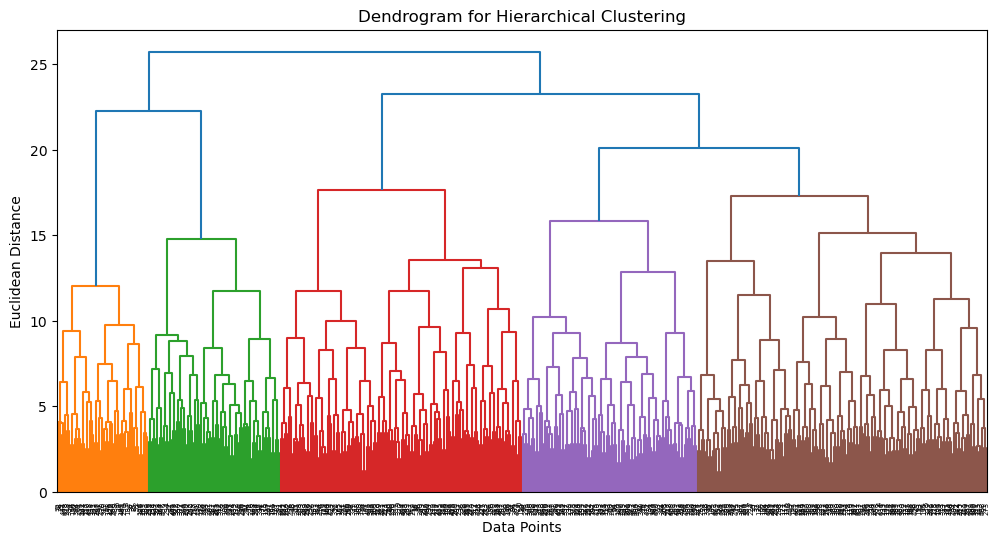

In [41]:
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt

# Plot the dendrogram
plt.figure(figsize=(12, 6))
sch.dendrogram(sch.linkage(df_scaled, method='ward'))
plt.title("Dendrogram for Hierarchical Clustering")
plt.xlabel("Data Points")
plt.ylabel("Euclidean Distance")
plt.show()


In [42]:
from sklearn.cluster import AgglomerativeClustering

# Selecting number of clusters (based on dendrogram)
num_clusters = 4

# Applying Agglomerative Clustering
hierarchical_model = AgglomerativeClustering(n_clusters=num_clusters, linkage='ward')
df["Cluster_Hierarchical"] = hierarchical_model.fit_predict(df_scaled)

# Display first few rows with assigned clusters
print(df.head())


   Age        BMI  Exercise_Hours_per_Week  Sleep_Hours_per_Day  Stress_Level  \
0   56  32.663810                        6             7.568660             4   
1   46  25.578401                        1             7.699627             5   
2   32  30.889373                        6             7.677665             8   
3   25  30.949957                        9             5.793015             4   
4   38  20.201544                        6             9.611211             4   

   Chronic_Diseases  Medication_Usage  Diet_Type  Mental_Health_Score  \
0                 1                 0          3             3.506237   
1                 0                 0          4             8.676838   
2                 3                 0          1             9.355452   
3                 2                 0          0             9.967585   
4                 3                 2          0             8.164067   

   Menstrual_Cycle  Family_History  Smoking_Habits  Alcohol_Consumption  \

In [43]:
from sklearn.mixture import GaussianMixture
import warnings
warnings.simplefilter("ignore", UserWarning)


import os
os.environ["OMP_NUM_THREADS"] = "2"


# Selecting number of clusters
gmm_model = GaussianMixture(n_components=4, random_state=42)
df["Cluster_GMM"] = gmm_model.fit_predict(df_scaled)

# Display first few rows with GMM clusters
print(df.head())


   Age        BMI  Exercise_Hours_per_Week  Sleep_Hours_per_Day  Stress_Level  \
0   56  32.663810                        6             7.568660             4   
1   46  25.578401                        1             7.699627             5   
2   32  30.889373                        6             7.677665             8   
3   25  30.949957                        9             5.793015             4   
4   38  20.201544                        6             9.611211             4   

   Chronic_Diseases  Medication_Usage  Diet_Type  Mental_Health_Score  \
0                 1                 0          3             3.506237   
1                 0                 0          4             8.676838   
2                 3                 0          1             9.355452   
3                 2                 0          0             9.967585   
4                 3                 2          0             8.164067   

   Menstrual_Cycle  Family_History  Smoking_Habits  Alcohol_Consumption  \

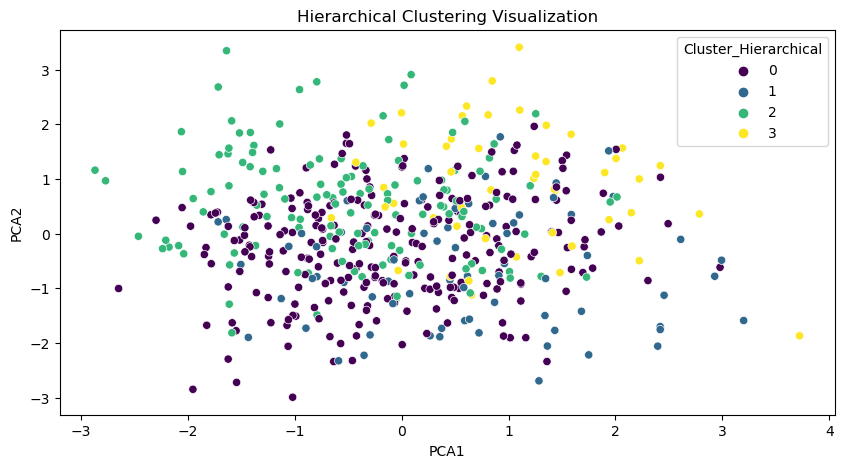

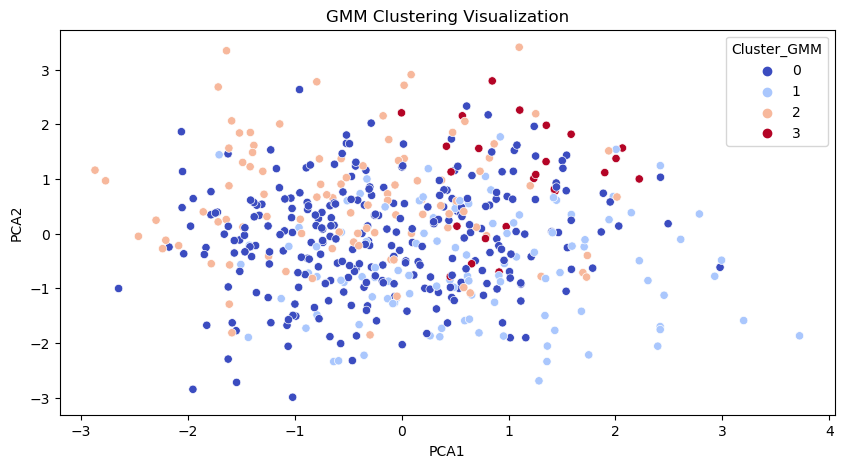

In [44]:
from sklearn.decomposition import PCA
import seaborn as sns

# Reduce dimensions to 2D
pca = PCA(n_components=2)
pca_features = pca.fit_transform(df_scaled)

df["PCA1"] = pca_features[:, 0]
df["PCA2"] = pca_features[:, 1]

# Plot hierarchical clustering
plt.figure(figsize=(10, 5))
sns.scatterplot(data=df, x="PCA1", y="PCA2", hue="Cluster_Hierarchical", palette="viridis")
plt.title("Hierarchical Clustering Visualization")
plt.show()

# Plot GMM clustering
plt.figure(figsize=(10, 5))
sns.scatterplot(data=df, x="PCA1", y="PCA2", hue="Cluster_GMM", palette="coolwarm")
plt.title("GMM Clustering Visualization")
plt.show()


In [45]:
from sklearn.decomposition import PCA

# Selecting relevant features for PCA
features = df.drop(columns=['Cluster_Hierarchical', 'Cluster_GMM'])  # Drop clustering labels
pca = PCA(n_components=2)  # Reduce to 2D
pca_data = pca.fit_transform(features)

# Convert to DataFrame -+
import pandas as pd
pca_df = pd.DataFrame(pca_data, columns=['PCA1', 'PCA2'])


In [46]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

# Silhouette Score (Higher is Better)
silhouette_hierarchical = silhouette_score(pca_data, df['Cluster_Hierarchical'])
silhouette_gmm = silhouette_score(pca_data, df['Cluster_GMM'])

# Davies-Bouldin Index (Lower is Better)
db_hierarchical = davies_bouldin_score(pca_data, df['Cluster_Hierarchical'])
db_gmm = davies_bouldin_score(pca_data, df['Cluster_GMM'])

print("Silhouette Score - Hierarchical:", silhouette_hierarchical)
print("Silhouette Score - GMM:", silhouette_gmm)
print("Davies-Bouldin Index - Hierarchical:", db_hierarchical)
print("Davies-Bouldin Index - GMM:", db_gmm)


Silhouette Score - Hierarchical: -0.05888208603097467
Silhouette Score - GMM: -0.044564640897783045
Davies-Bouldin Index - Hierarchical: 18.46765918869999
Davies-Bouldin Index - GMM: 32.43860000588731


In [47]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import warnings
warnings.simplefilter("ignore", UserWarning)


# Trying 3 clusters instead of 4
n_clusters = 3

# Hierarchical Clustering
hierarchical = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
df['Cluster_Hierarchical'] = hierarchical.fit_predict(pca_data)

# GMM Clustering
gmm = GaussianMixture(n_components=n_clusters, covariance_type='full', random_state=42)
df['Cluster_GMM'] = gmm.fit_predict(pca_data)

# Recalculate metrics
silhouette_hierarchical = silhouette_score(pca_data, df['Cluster_Hierarchical'])
silhouette_gmm = silhouette_score(pca_data, df['Cluster_GMM'])
db_hierarchical = davies_bouldin_score(pca_data, df['Cluster_Hierarchical'])
db_gmm = davies_bouldin_score(pca_data, df['Cluster_GMM'])

print("Silhouette Score - Hierarchical:", silhouette_hierarchical)
print("Silhouette Score - GMM:", silhouette_gmm)
print("Davies-Bouldin Index - Hierarchical:", db_hierarchical)
print("Davies-Bouldin Index - GMM:", db_gmm)


Silhouette Score - Hierarchical: 0.4029929265106757
Silhouette Score - GMM: 0.4254856286493681
Davies-Bouldin Index - Hierarchical: 0.8829207339010642
Davies-Bouldin Index - GMM: 0.8436502334576996


In [48]:
pca = PCA(n_components=5)  # Instead of 2
pca_data = pca.fit_transform(features)


In [49]:
from sklearn.cluster import KMeans
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import warnings
warnings.simplefilter("ignore", UserWarning)


kmeans = KMeans(n_clusters=4, random_state=42)
df['Cluster_KMeans'] = kmeans.fit_predict(pca_data)


In [50]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.5, min_samples=5)
df['Cluster_DBSCAN'] = dbscan.fit_predict(pca_data)


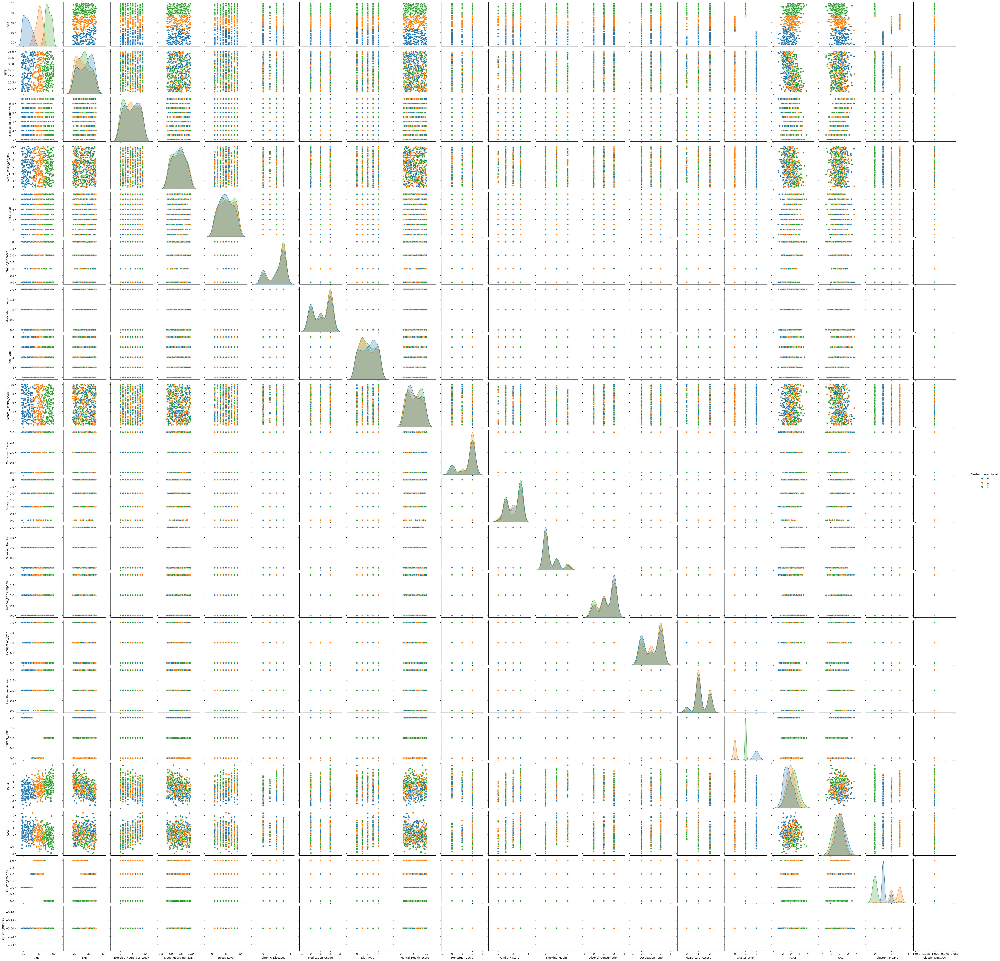

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

sns.pairplot(df, hue="Cluster_Hierarchical", diag_kind="kde", palette="tab10")
plt.show()


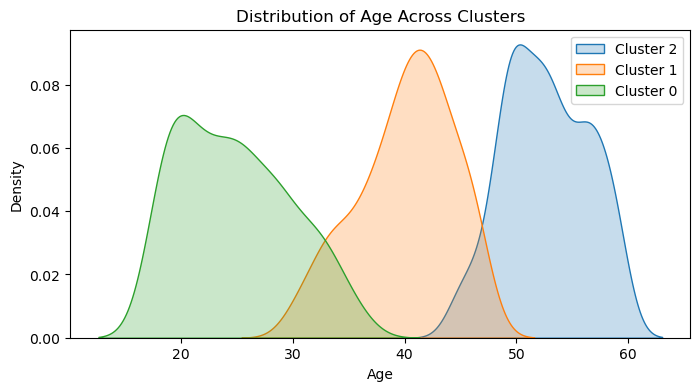

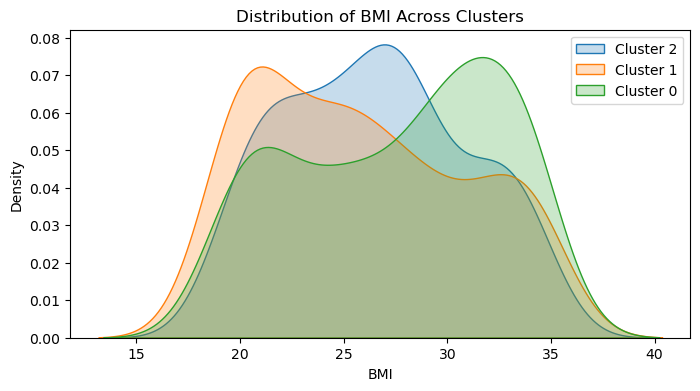

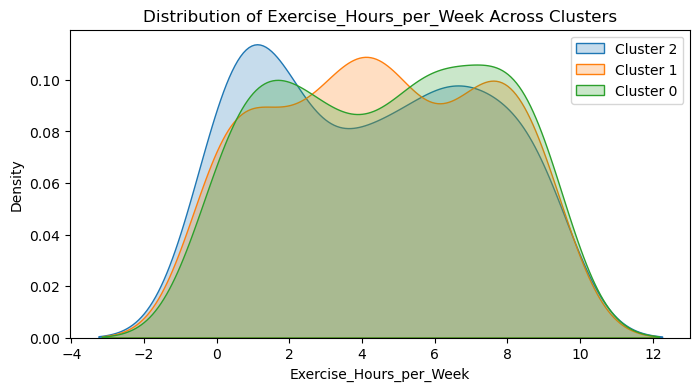

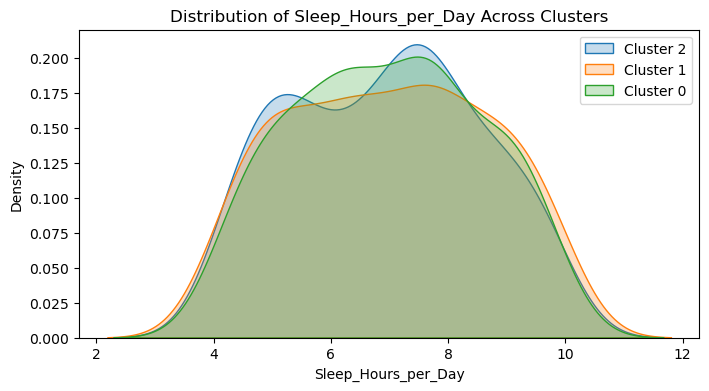

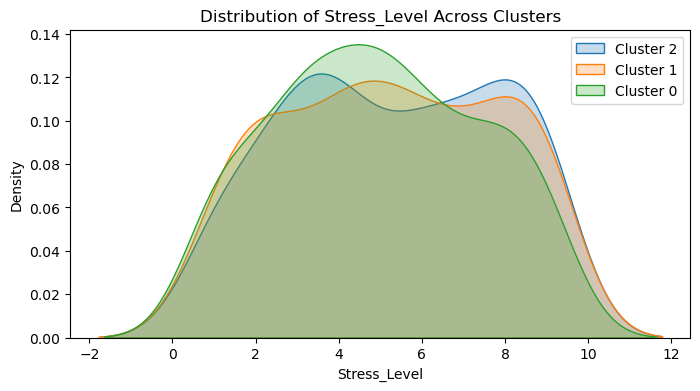

In [52]:
import numpy as np

# Select numerical features to analyze
features = ["Age", "BMI", "Exercise_Hours_per_Week", "Sleep_Hours_per_Day", "Stress_Level"]  # Replace with actual feature names
cluster_column = "Cluster_Hierarchical"  # Change based on the best method

# Plot distribution for each feature
for feature in features:
    plt.figure(figsize=(8, 4))
    for cluster in df[cluster_column].unique():
        subset = df[df[cluster_column] == cluster]
        sns.kdeplot(subset[feature], label=f"Cluster {cluster}", shade=True)
    plt.title(f"Distribution of {feature} Across Clusters")
    plt.legend()
    plt.show()


In [53]:
cluster_means = df.groupby(cluster_column).mean()
print(cluster_means)


                            Age        BMI  Exercise_Hours_per_Week  \
Cluster_Hierarchical                                                  
0                     24.824242  27.603450                 4.654545   
1                     40.115152  25.852747                 4.503030   
2                     52.635294  26.498045                 4.264706   

                      Sleep_Hours_per_Day  Stress_Level  Chronic_Diseases  \
Cluster_Hierarchical                                                        
0                                6.963092      4.939394          2.054545   
1                                6.978940      5.218182          2.218182   
2                                6.905539      5.305882          2.241176   

                      Medication_Usage  Diet_Type  Mental_Health_Score  \
Cluster_Hierarchical                                                     
0                             1.096970   2.115152             5.390051   
1                             1.2303

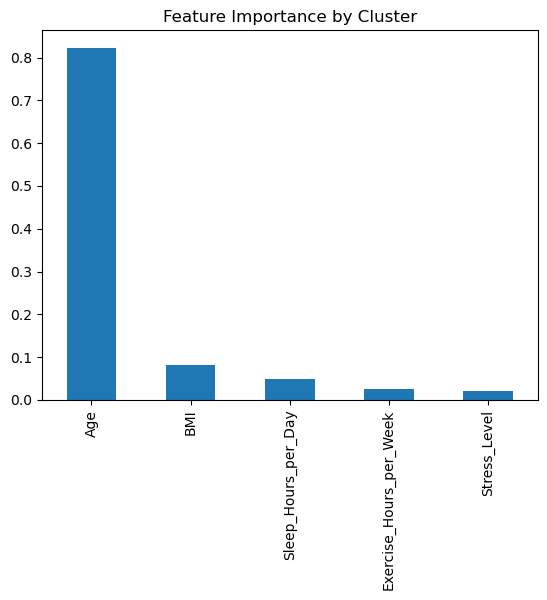

In [54]:
from sklearn.ensemble import RandomForestClassifier

X = df[features]
y = df[cluster_column]

model = RandomForestClassifier(random_state=42)
model.fit(X, y)

feature_importances = pd.Series(model.feature_importances_, index=features)
feature_importances.sort_values(ascending=False).plot(kind="bar", title="Feature Importance by Cluster")
plt.show()


In [55]:
print(df.shape)  # check for the dataset is too large



(500, 21)


In [56]:
# Group data by clusters and calculate mean values
cluster_summary = df.groupby(cluster_column).mean()
print(cluster_summary)


                            Age        BMI  Exercise_Hours_per_Week  \
Cluster_Hierarchical                                                  
0                     24.824242  27.603450                 4.654545   
1                     40.115152  25.852747                 4.503030   
2                     52.635294  26.498045                 4.264706   

                      Sleep_Hours_per_Day  Stress_Level  Chronic_Diseases  \
Cluster_Hierarchical                                                        
0                                6.963092      4.939394          2.054545   
1                                6.978940      5.218182          2.218182   
2                                6.905539      5.305882          2.241176   

                      Medication_Usage  Diet_Type  Mental_Health_Score  \
Cluster_Hierarchical                                                     
0                             1.096970   2.115152             5.390051   
1                             1.2303

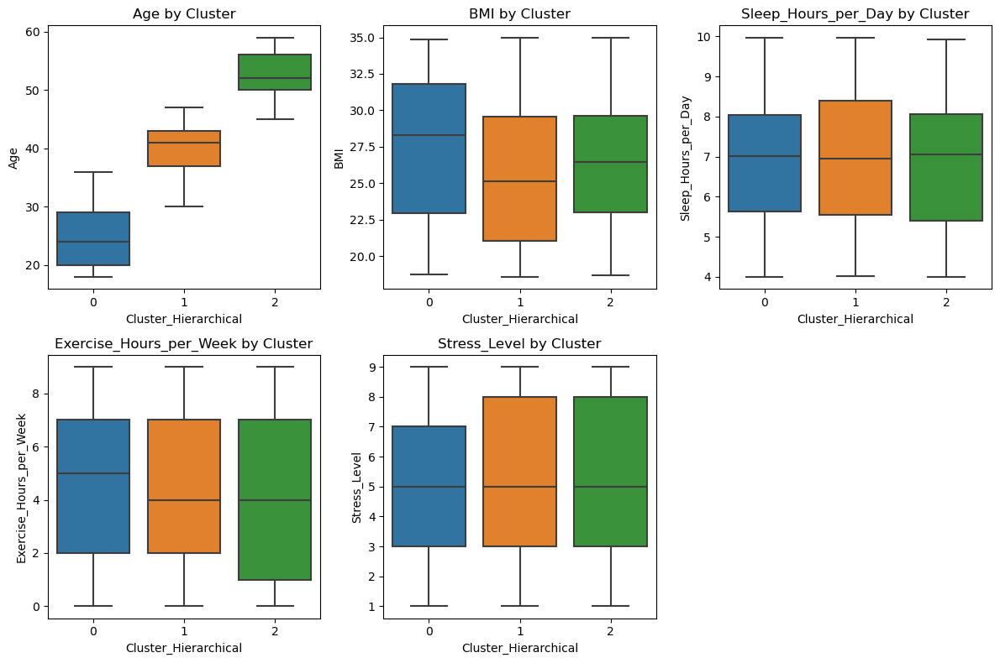

In [57]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select important features 
important_features = ["Age", "BMI", "Sleep_Hours_per_Day", "Exercise_Hours_per_Week", "Stress_Level"]

# Create boxplots
plt.figure(figsize=(12, 8))
for i, feature in enumerate(important_features, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(x=df[cluster_column], y=df[feature])
    plt.title(f"{feature} by Cluster")
plt.tight_layout()
plt.show()


In [58]:
# Define meaningful labels based on observations
cluster_labels = {
    1: "Balanced Lifestyle",
    2: "Young & Active",
    3: "Older & Health Conscious",
    4: "High Stress & Low Activity"
}

# Apply labels to the DataFrame
df["Cluster_Label"] = df["Cluster_Hierarchical"].map(cluster_labels)

# Display a sample of labeled clusters
df[["Cluster_Hierarchical", "Cluster_Label"]].head()


,Cluster_Hierarchical,Cluster_Label
0,2,Young & Active
1,1,Balanced Lifestyle
2,0,NaN
3,0,NaN
4,1,Balanced Lifestyle


In [59]:
# Convert cluster column to integer 
df["Cluster_Hierarchical"] = df["Cluster_Hierarchical"].astype(int)

# Define meaningful labels based on observations
cluster_labels = {
    1: "Balanced Lifestyle",
    2: "Young & Active",
    3: "Older & Health Conscious",
    4: "High Stress & Low Activity"
}

# Apply labels to the DataFrame
df["Cluster_Label"] = df["Cluster_Hierarchical"].map(cluster_labels)

# Display a sample of labeled clusters
df[["Cluster_Hierarchical", "Cluster_Label"]].head()


,Cluster_Hierarchical,Cluster_Label
0,2,Young & Active
1,1,Balanced Lifestyle
2,0,NaN
3,0,NaN
4,1,Balanced Lifestyle


In [60]:
print(df[["Cluster_Hierarchical", "Cluster_Label"]].head(10))


   Cluster_Hierarchical       Cluster_Label
0                     2      Young & Active
1                     1  Balanced Lifestyle
2                     0                 NaN
3                     0                 NaN
4                     1  Balanced Lifestyle
5                     2      Young & Active
6                     1  Balanced Lifestyle
7                     1  Balanced Lifestyle
8                     0                 NaN
9                     0                 NaN


In [61]:
# Analyze Cluster Characteristics
# Group by cluster labels and get mean values
cluster_summary = df.groupby("Cluster_Label")[["Age", "BMI", "Sleep_Hours_per_Day", "Exercise_Hours_per_Week", "Stress_Level"]].mean()
print(cluster_summary)


                          Age        BMI  Sleep_Hours_per_Day  \
Cluster_Label                                                   
Balanced Lifestyle  40.115152  25.852747             6.978940   
Young & Active      52.635294  26.498045             6.905539   

                    Exercise_Hours_per_Week  Stress_Level  
Cluster_Label                                              
Balanced Lifestyle                 4.503030      5.218182  
Young & Active                     4.264706      5.305882  


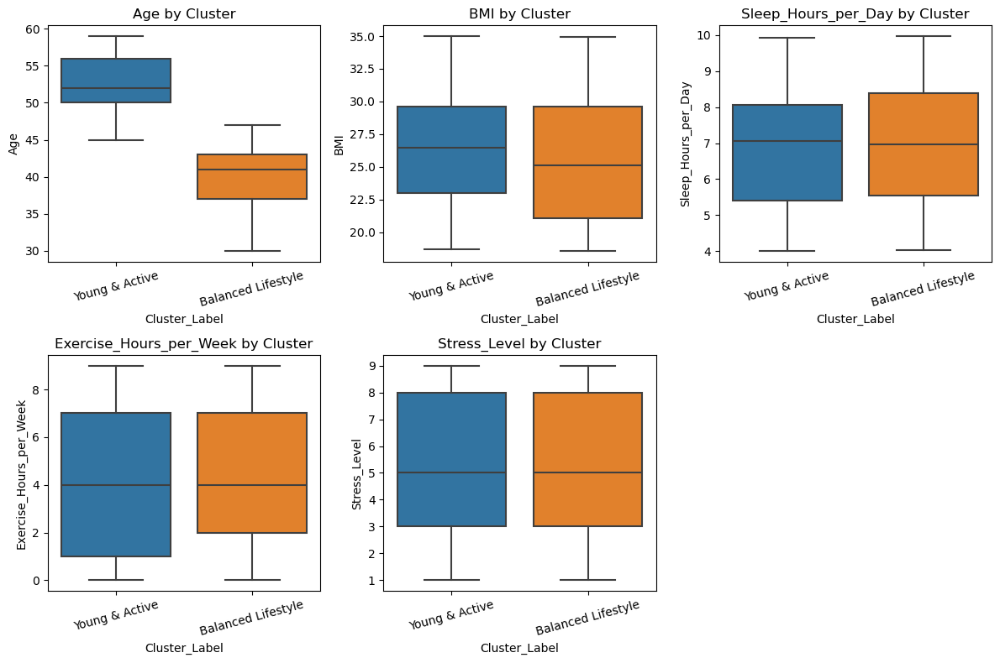

In [62]:
#Visualize Cluster Distributions
import seaborn as sns
import matplotlib.pyplot as plt

important_features = ["Age", "BMI", "Sleep_Hours_per_Day", "Exercise_Hours_per_Week", "Stress_Level"]

plt.figure(figsize=(12, 8))
for i, feature in enumerate(important_features, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(x=df["Cluster_Label"], y=df[feature])
    plt.title(f"{feature} by Cluster")
    plt.xticks(rotation=15)  # Rotate labels for readability
plt.tight_layout()
plt.show()




(array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
 [Text(0.0, 0, '0.0'),
  Text(0.2, 0, '0.2'),
  Text(0.4, 0, '0.4'),
  Text(0.6000000000000001, 0, '0.6'),
  Text(0.8, 0, '0.8'),
  Text(1.0, 0, '1.0')])

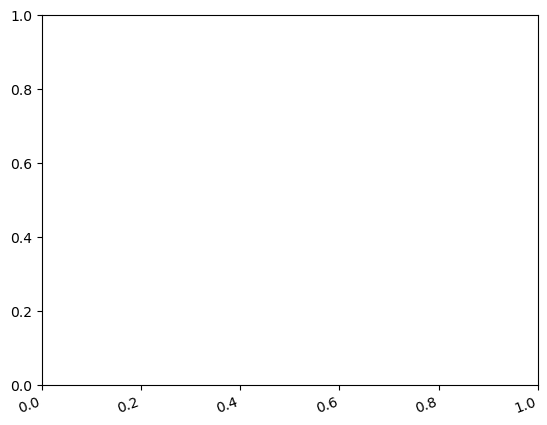

In [63]:
plt.xticks(rotation=20, ha="right")  # Rotate labels by 20 degrees


(array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
 [Text(0.0, 0, '0.0'),
  Text(0.2, 0, '0.2'),
  Text(0.4, 0, '0.4'),
  Text(0.6000000000000001, 0, '0.6'),
  Text(0.8, 0, '0.8'),
  Text(1.0, 0, '1.0')])

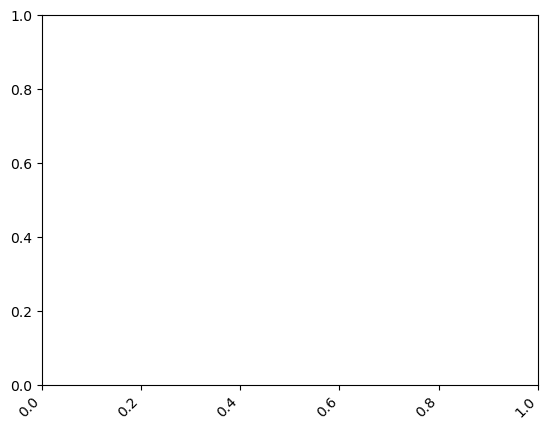

In [64]:
plt.xticks(rotation=45, ha="right")  # Rotate labels by 45 degrees


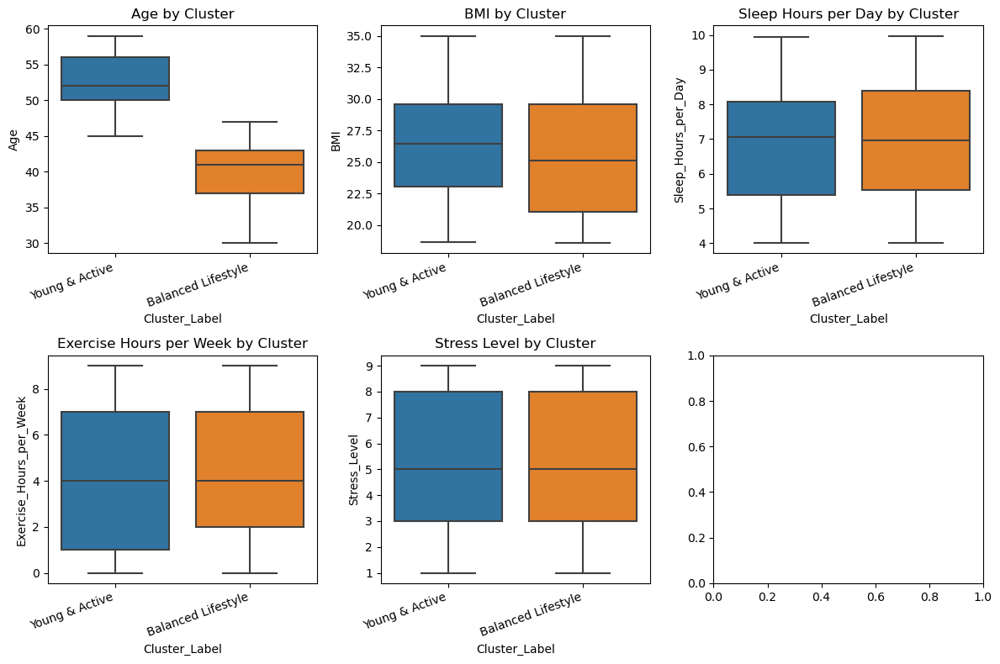

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set figure size
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

# List of columns to plot
columns = ["Age", "BMI", "Sleep_Hours_per_Day", "Exercise_Hours_per_Week", "Stress_Level"]
titles = ["Age by Cluster", "BMI by Cluster", "Sleep Hours per Day by Cluster",
          "Exercise Hours per Week by Cluster", "Stress Level by Cluster"]

# Loop to plot each boxplot
for i, col in enumerate(columns):
    ax = axes[i // 3, i % 3]  # Position in grid
    sns.boxplot(x=df["Cluster_Label"], y=df[col], ax=ax)
    ax.set_title(titles[i])
    ax.set_xlabel("Cluster_Label")
    ax.set_ylabel(col)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=20, ha="right")  # Rotate x-axis labels

# Adjust layout
plt.tight_layout()
plt.show()


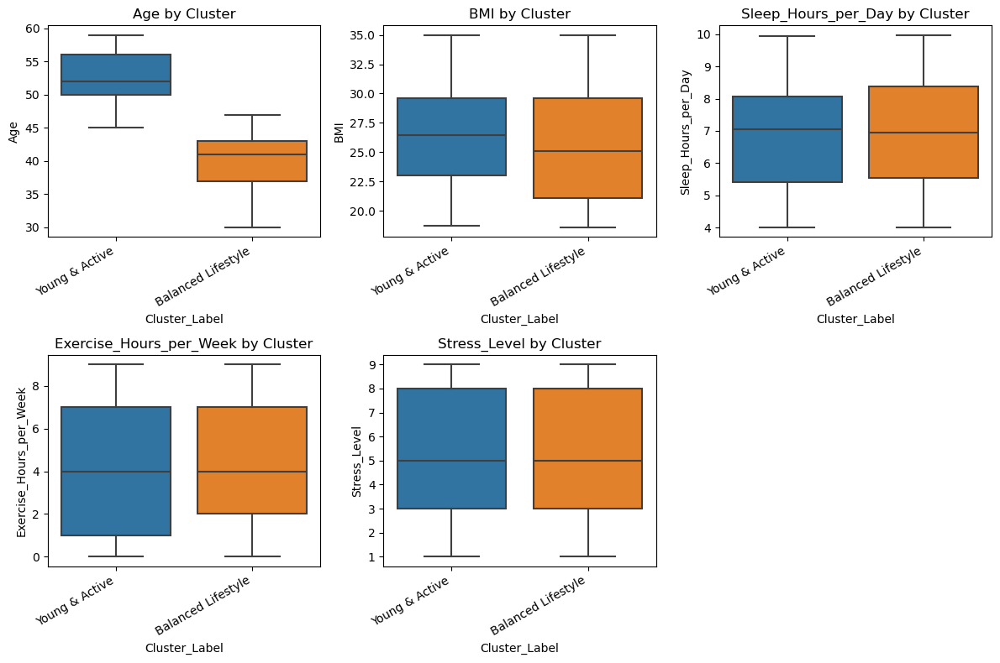

In [66]:
import seaborn as sns
import matplotlib.pyplot as plt

important_features = ["Age", "BMI", "Sleep_Hours_per_Day", "Exercise_Hours_per_Week", "Stress_Level"]

plt.figure(figsize=(12, 8))
for i, feature in enumerate(important_features, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(x=df["Cluster_Label"], y=df[feature])
    plt.title(f"{feature} by Cluster")
    plt.xticks(rotation=30, ha="right")  # Rotate and align labels properly

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


In [67]:
print(df.head())  # Ensure cluster labels are correct
print(df.dtypes)  # Check for unexpected data type issues


   Age        BMI  Exercise_Hours_per_Week  Sleep_Hours_per_Day  Stress_Level  \
0   56  32.663810                        6             7.568660             4   
1   46  25.578401                        1             7.699627             5   
2   32  30.889373                        6             7.677665             8   
3   25  30.949957                        9             5.793015             4   
4   38  20.201544                        6             9.611211             4   

   Chronic_Diseases  Medication_Usage  Diet_Type  Mental_Health_Score  \
0                 1                 0          3             3.506237   
1                 0                 0          4             8.676838   
2                 3                 0          1             9.355452   
3                 2                 0          0             9.967585   
4                 3                 2          0             8.164067   

   Menstrual_Cycle  ...  Alcohol_Consumption  Occupation_Type  \
0        

In [68]:
cluster_summary = df.groupby("Cluster_Label").agg(["mean", "std", "min", "max"])
print(cluster_summary)


                          Age                          BMI            \
                         mean       std min max       mean       std   
Cluster_Label                                                          
Balanced Lifestyle  40.115152  4.243224  30  47  25.852747  5.006123   
Young & Active      52.635294  3.745916  45  59  26.498045  4.397532   

                                         Exercise_Hours_per_Week            \
                          min        max                    mean       std   
Cluster_Label                                                                
Balanced Lifestyle  18.576428  34.948425                4.503030  2.912597   
Young & Active      18.678821  34.995342                4.264706  3.029528   

                    ...      PCA2           Cluster_KMeans                    \
                    ...       min       max           mean       std min max   
Cluster_Label       ...                                                        
Balanced

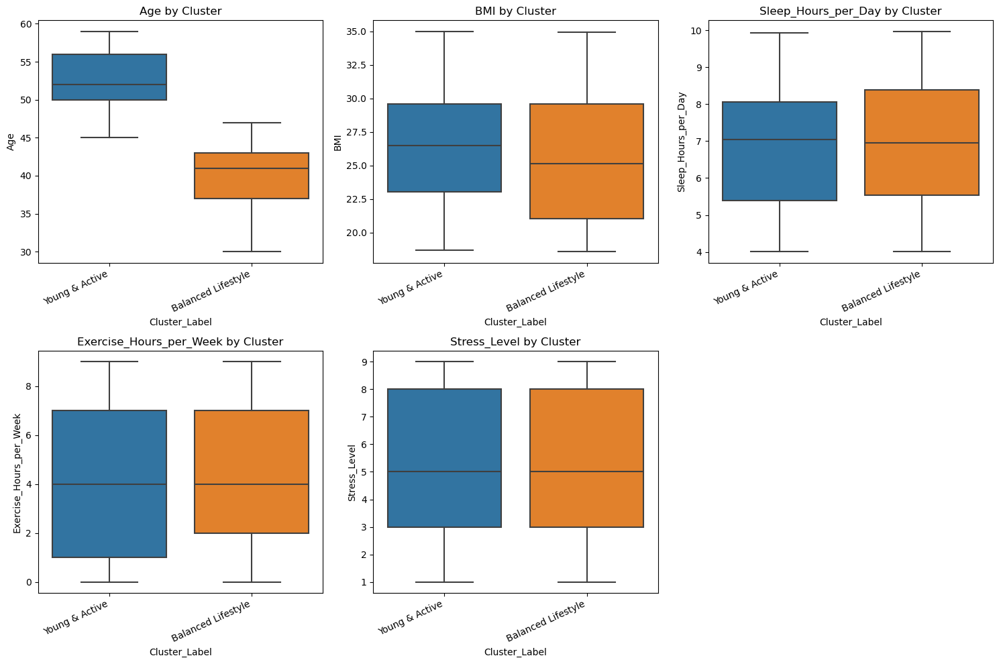

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

important_features = ["Age", "BMI", "Sleep_Hours_per_Day", "Exercise_Hours_per_Week", "Stress_Level"]

plt.figure(figsize=(15, 10))  # Increase figure size
for i, feature in enumerate(important_features, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(x=df["Cluster_Label"], y=df[feature])
    plt.title(f"{feature} by Cluster")
    plt.xticks(rotation=25, ha='right')  # Better label rotation
plt.tight_layout()
plt.show()


In [70]:
df.to_csv("clustered_health_profiles.csv", index=False)


In [71]:
print(df.head())  # Ensure cluster labels are correct



   Age        BMI  Exercise_Hours_per_Week  Sleep_Hours_per_Day  Stress_Level  \
0   56  32.663810                        6             7.568660             4   
1   46  25.578401                        1             7.699627             5   
2   32  30.889373                        6             7.677665             8   
3   25  30.949957                        9             5.793015             4   
4   38  20.201544                        6             9.611211             4   

   Chronic_Diseases  Medication_Usage  Diet_Type  Mental_Health_Score  \
0                 1                 0          3             3.506237   
1                 0                 0          4             8.676838   
2                 3                 0          1             9.355452   
3                 2                 0          0             9.967585   
4                 3                 2          0             8.164067   

   Menstrual_Cycle  ...  Alcohol_Consumption  Occupation_Type  \
0        

In [75]:
# Check Cluster Sizes
print(df['Cluster_Hierarchical'].value_counts())
print(df['Cluster_GMM'].value_counts())


Cluster_Hierarchical
2    170
1    165
0    165
Name: count, dtype: int64
Cluster_GMM
0    183
1    174
2    143
Name: count, dtype: int64
